# Rhabdomere lengths of photoreceptor subtypes

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D

from src.dataframe_tools import assemble_rhabdomere_df
from vis.fig_tools import subtype_cm
from vis.hex_lattice import hexplot, om_to_hex
from mpl_toolkits.mplot3d import Axes3D

cm = subtype_cm()

plt.rcdefaults()
plt.style.use('vis/lamina.mplstyle')

In [3]:
### SAVE FIGS? ###
save_figs=True
##################
# if save_figs:
#     fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/FNAME.svg')
#     fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/FNAME.png')

In [4]:
xl_dir = '~/Data/200824_microvilli.xlsx'
raw_df = pd.read_excel(xl_dir, sheet_name='microvilli angle', header=None, index_col=None)
rhab = assemble_rhabdomere_df(raw_df)


In [5]:
# A dataframe indexed containing fields for each rhabdomere's distal and proximal
# extents (z-index), length (microns), corresponding rhabdom's length
df = pd.DataFrame(index=pd.MultiIndex.from_product([np.unique(rhab['om']), np.unique(rhab['subtype'])], 
                                                        names=['om', 'subtype']), 
                  columns=['dist_z', 'prox_z', 'len', 'rhabdom_len'])

for om, om_rows in rhab.groupby('om'):
    dist_rhabdom_z = om_rows['z-index'].min()
    prox_rhabdom_z = om_rows['z-index'].max()
    rhabdom_zlen = abs(dist_rhabdom_z - prox_rhabdom_z)
    
    for st, rows in om_rows.groupby('subtype'):
        pr = (om, st)
        # the most distal z of each rhabdom becomes the 0 point
        df.loc[pr]['dist_z'] = abs(rows['z-index'].min() - dist_rhabdom_z)
        df.loc[pr]['prox_z'] = abs(rows['z-index'].max() - dist_rhabdom_z)
        # the following are converted to microns
        df.loc[pr]['len'] = abs(df.loc[pr]['dist_z'] - df.loc[pr]['prox_z']) * 0.008
        df.loc[pr]['rhabdom_len'] = rhabdom_zlen * 0.008
        
df.reset_index(inplace=True)

In [6]:
df

,om,subtype,dist_z,prox_z,len,rhabdom_len
0,A0,R1,88,1465,11.016,18.248
1,A0,R2,148,2065,15.336,18.248
2,A0,R3,95,1904,14.472,18.248
3,A0,R4,77,1796,13.752,18.248
4,A0,R5,89,2186,16.776,18.248
...,...,...,...,...,...,...
256,E7,R5,66,1515,11.592,13.96
257,E7,R6,50,1391,10.728,13.96
258,E7,R7,33,1491,11.664,13.96
259,E7,R7p,97,1519,11.376,13.96


om
A0    18.248
A1    15.992
A2    14.496
A3    12.968
A4    12.096
A5    13.304
B0    17.064
B1    17.392
B2    15.184
B3     14.88
B4    13.224
B5    13.368
B6    14.192
C1    15.584
C2     15.68
C3    14.592
C4    13.312
C5    12.888
C6    14.136
D2     13.76
D3     14.64
D4    13.792
D5     13.52
D6    13.976
D7    14.032
E4    12.704
E5    11.088
E6    13.352
E7     13.96
Name: rhabdom_len, dtype: object

'Mean:  14.26'

'SD:  1.54'

<AxesSubplot:title={'center':'Rhabdom length ($\\mu$m)'}>

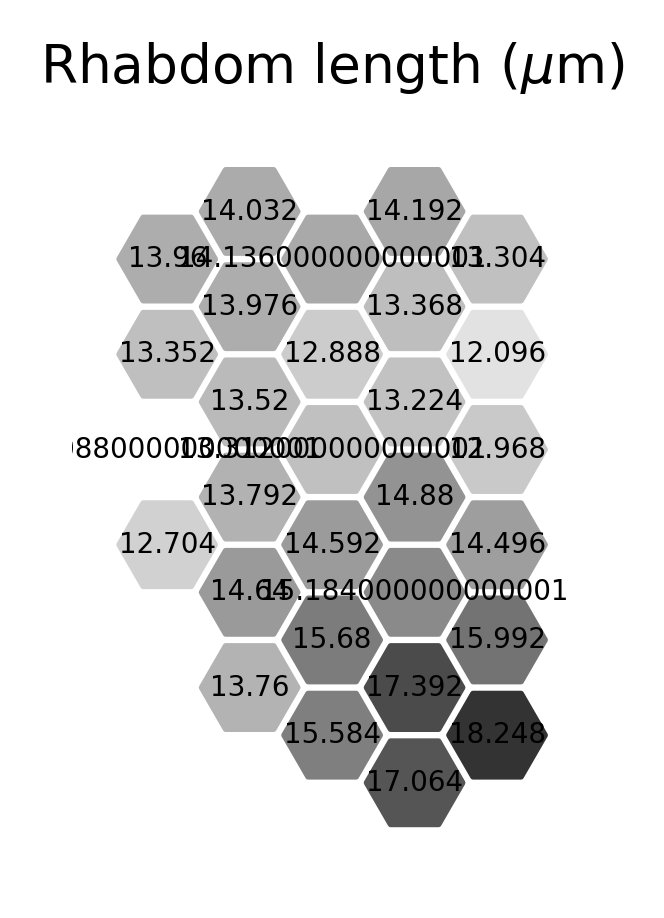

In [7]:
data = df.loc[df['subtype'] == 'R1', ('om', 'rhabdom_len')].set_index('om')
data = data['rhabdom_len']
display(data)
#data.to_pickle("~/Dropbox/Data/201123_rh_len_df.pickle")
display(f"Mean: {data.mean(): .2f}")
display(f"SD: {data.std(ddof=0): .2f}")
fig, ax = plt.subplots(1)
ax.set_title('Rhabdom length ($\mu$m)')
fig.tight_layout(pad=0)
hexplot(pd.Series(data), ax=ax)


In [8]:
if save_figs:
    fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/rhabdomlenhex.svg')
    fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/rhabdomlenhex.png')

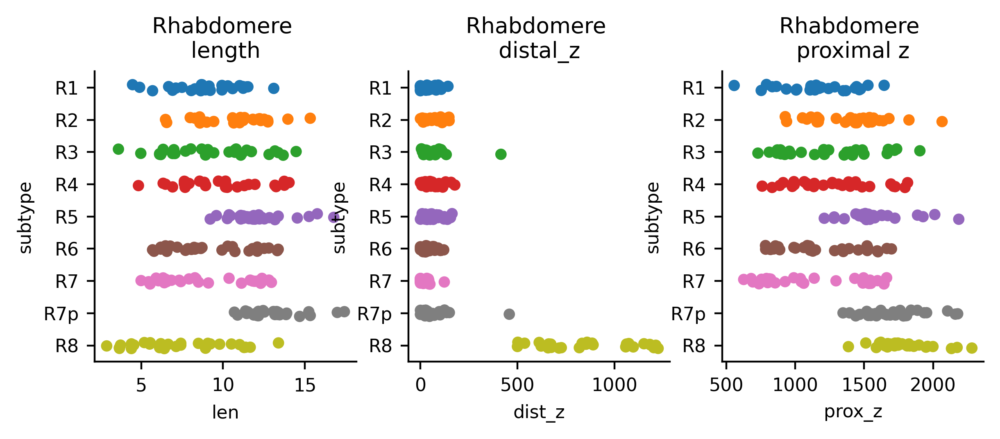

In [9]:
fig, ax = plt.subplots(1, 3, figsize=[7, 2.3])

sns.stripplot(x='len', y='subtype', data=df, ax=ax[0])
sns.stripplot(x='dist_z', y='subtype', data=df, ax=ax[1])
sns.stripplot(x='prox_z', y='subtype', data=df, ax=ax[2])

ax[0].set_title('Rhabdomere \nlength')
ax[1].set_title('Rhabdomere \ndistal_z')
ax[2].set_title('Rhabdomere \nproximal z')

plt.show()

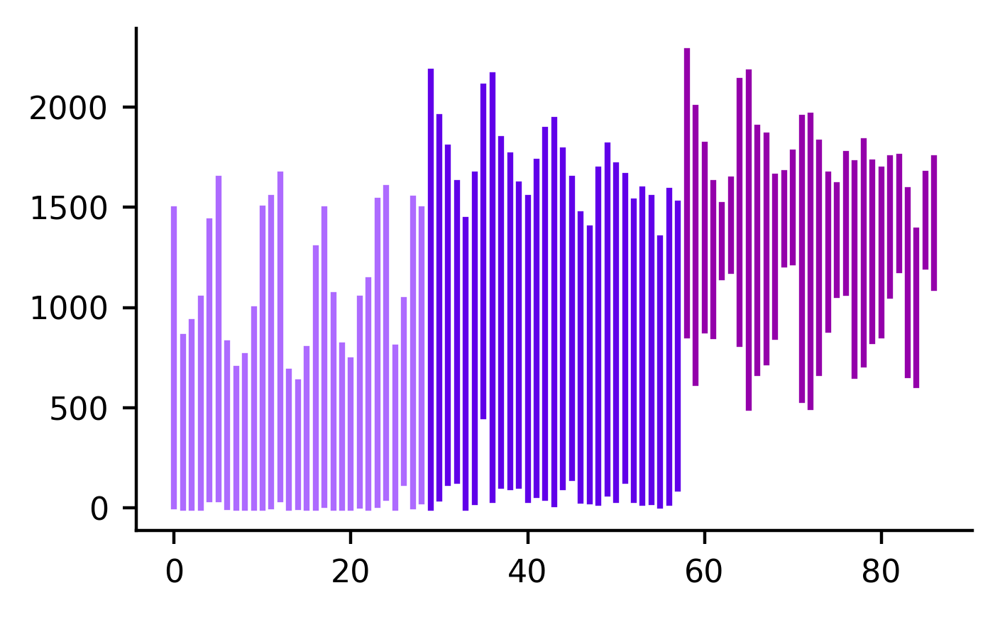

In [10]:
fig, ax = plt.subplots()
y = 0
for st, rows in df.groupby('subtype'):
    if st not in ['R7', 'R8', "R7p"]:
        continue
    else:
        for ind, r in rows.sort_values(by='om').iterrows():
    
            ax.plot([y, y], [r['dist_z'], r['prox_z']], c=cm[st])
            y +=1

In [11]:
lvf_rows = [i for i, r in df.iterrows() if (int(r['subtype'][1]) > 6)]
lvf_df = df.loc[lvf_rows]
#display(lvf_df)

In [12]:
# # Explore different viewing angles (AZIMUTH) for 3D plot

# fig = plt.figure(figsize=[20, 40])

# bar_width = 0.1

# sts = ['R7', 'R8']
# cs = ['fuchsia', 'blueviolet']
# shift = 0
# for i, angle in enumerate(range(0, 360, 10)):
    
#     ax = fig.add_subplot(18, 2, i + 1, projection='3d')

#     ax.view_init(45, angle) # (elav, azim)
    
#     for st, c in zip(sts, cs):
#         X = []
#         Y = []
#         Z = []
#         DZ = []

#         for om, rows in lvf_df.groupby('om'):
#             x, y = om_to_hex(om)
#             z = rows.loc[rows['subtype'] == st, 'prox_z'].values[0]
#             dz = z - rows.loc[rows['subtype'] == st, 'dist_z'].values[0]

#             X.append(x)
#             Y.append(y + shift)
#             Z.append(z)
#             DZ.append(dz)
#         shift += bar_width * 2
#         ax.bar3d(X, Y, Z, bar_width, bar_width, DZ, color=c)
#         ax.set_xlabel('Anterior -> Posterior')
#         ax.set_ylabel('Ventral -> Dorsal')
#         ax.set_title(f'azimuth = {angle}')
#         #ax.legend()
    




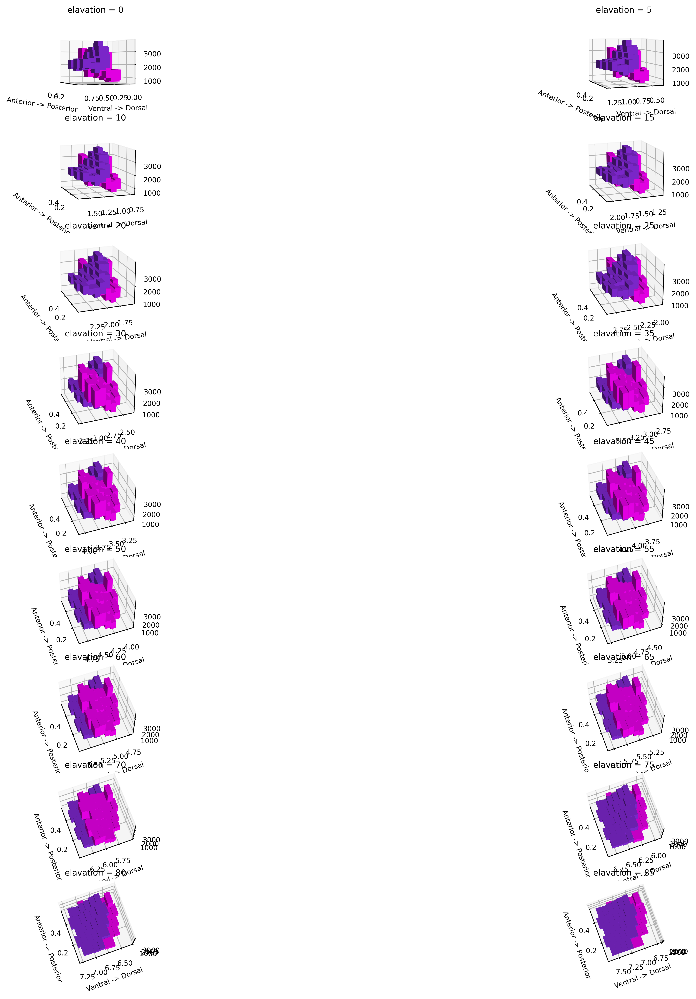

In [13]:
# Explore different viewing angles (ELEVATION) for 3D plot

fig = plt.figure(figsize=[20, 40])

bar_width = 0.1

sts = ['R7', 'R8']
cs = ['fuchsia', 'blueviolet']
shift = 0
for i, angle in enumerate(range(0, 90, 5)):
    
    ax = fig.add_subplot(18, 2, i + 1, projection='3d')

    ax.view_init(angle, 160) # (elav, azim)
    
    for st, c in zip(sts, cs):
        X = []
        Y = []
        Z = []
        DZ = []

        for om, rows in lvf_df.groupby('om'):
            x, y = om_to_hex(om)
            z = rows.loc[rows['subtype'] == st, 'prox_z'].values[0]
            dz = z - rows.loc[rows['subtype'] == st, 'dist_z'].values[0]

            X.append(x)
            Y.append(y + shift)
            Z.append(z)
            DZ.append(dz)
        shift += bar_width * 2
        ax.bar3d(X, Y, Z, bar_width, bar_width, DZ, color=c)
        ax.set_xlabel('Anterior -> Posterior')
        ax.set_ylabel('Ventral -> Dorsal')
        ax.set_title(f'elavation = {angle}')
        #ax.legend()
    




[2281.0, 1999.0, 1812.0, 1621.0, 1512.0, 1639.0, 2133.0, 2174.0, 1898.0, 1860.0, 1653.0, 1671.0, 1774.0, 1948.0, 1960.0, 1824.0, 1664.0, 1611.0, 1767.0, 1720.0, 1830.0, 1724.0, 1690.0, 1747.0, 1754.0, 1588.0, 1386.0, 1669.0, 1745.0]


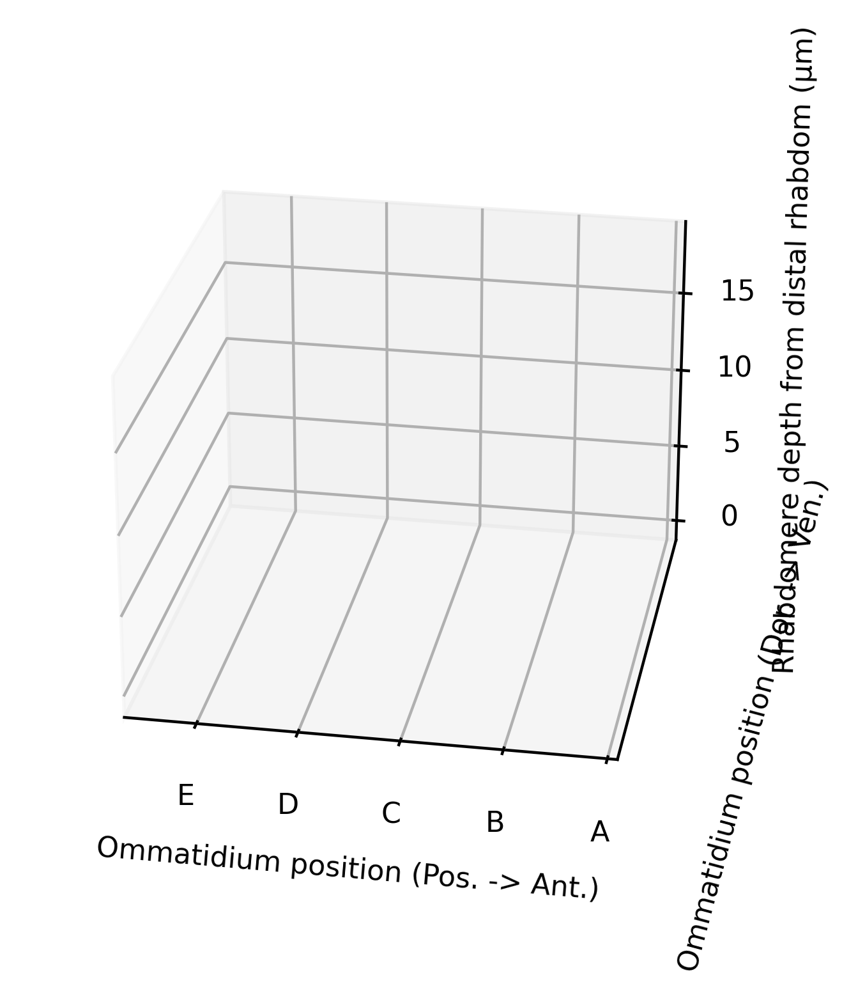

In [14]:
fig = plt.figure(figsize=[3.8, 4.6])
ax = fig.add_subplot(111, projection='3d')
azim = 100
elev = 25

ax.view_init(elev, azim)

w = 2

sts = ['R8', 'R7']
cs = ['blueviolet', 'fuchsia']
shift = 0
for st, c in zip(sts, cs):
    
    for om, rows in lvf_df.groupby('om'):
        x, y = om_to_hex(om)
        
        # TODO: adjust coords from om_to_hex
        x = x - 4.0
        y = (y + 33) * 4
        
        proxz = rows.loc[rows['subtype'] == st, 'prox_z'].values[0] * 0.008
        distz = rows.loc[rows['subtype'] == st, 'dist_z'].values[0] * 0.008 # microns

        ax.plot([x, x], [y, y], [proxz, distz], color=c, linewidth=w, alpha=0.3, zorder=0)
        ax.scatter([x, x], [y, y], [distz, proxz], s=(w + 1)**2, color=c, facecolor='w', alpha=1.0)
        
        if st == 'R7':
            ax.text(x - 0.05, y, 0, str(om), zdir='x', fontsize=8)

        
ax.set_xticks(np.arange(0.0, 4.0,  np.sqrt(3.0)/2.0))
ax.set_xlim([0, 4.0])
ax.set_xticklabels(['A', 'B', 'C', 'D', 'E'])
ax.set_xlabel('Ommatidium position (Pos. -> Ant.)')

ax.set_yticks([])
ax.set_ylabel('Ommatidium position (Dor. -> Ven.)')

ax.set_zticks(np.arange(0, 20, 5))
ax.set_zlabel('Rhabdomere depth from distal rhabdom (\u03BCm)')


print(Z)


In [15]:
fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/r7r8-3d-flipped.svg', dpi=1000)

Text(0.5, 0, 'Rhabdomere depth from distal rhabdom (μm)')

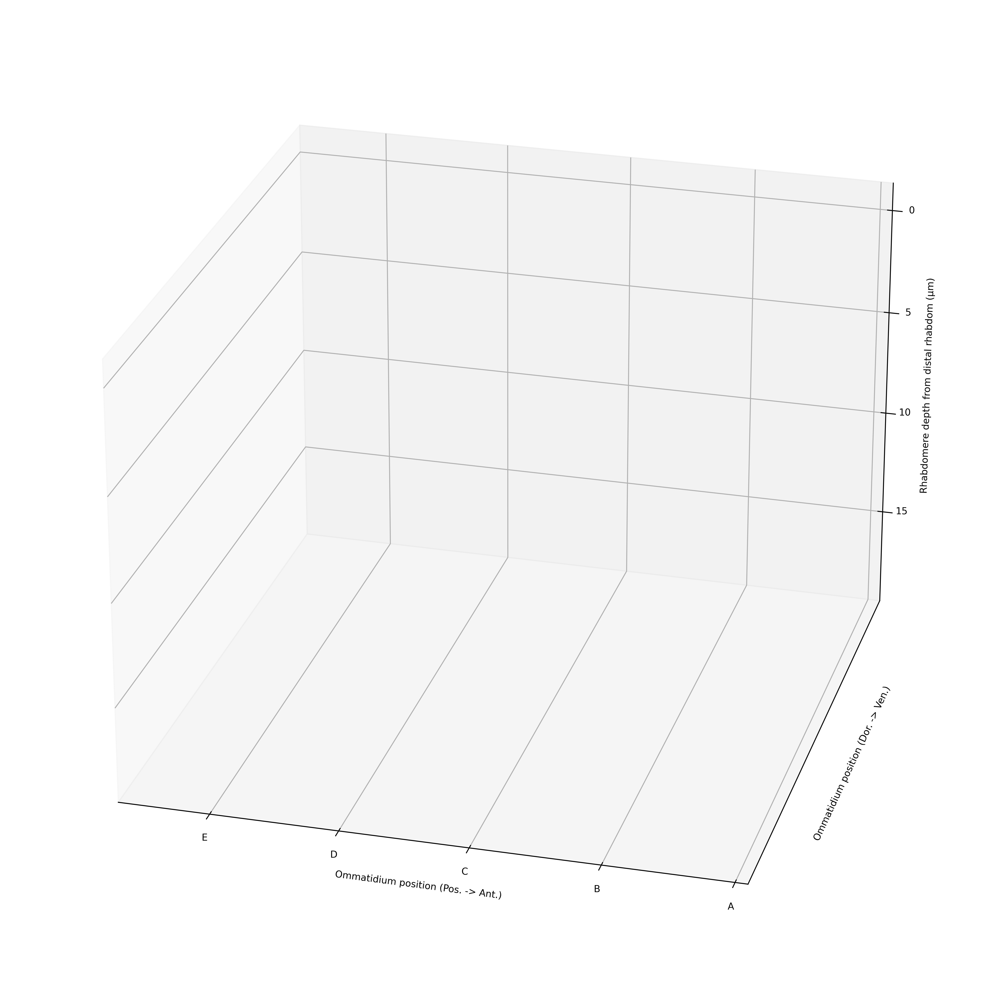

In [16]:
fig = plt.figure(figsize=[20, 15])
ax = fig.add_subplot(111, projection='3d')
azim = 105
elev = 25

ax.view_init(elev, azim)
ax.invert_zaxis()

w = 8

sts = ['R8', 'R7']
cs = ['blueviolet', 'fuchsia']
shift = 0
for st, c in zip(sts, cs):
#     X = []
#     Y = []
#     Z = []
#     DZ = []
    
    for om, rows in lvf_df.groupby('om'):
        x, y = om_to_hex(om)
        
        # TODO: adjust coords from om_to_hex
        x = x - 4.0
        y = (y + 33) * 6
        
        proxz = rows.loc[rows['subtype'] == st, 'prox_z'].values[0] * 0.008
        distz = rows.loc[rows['subtype'] == st, 'dist_z'].values[0] * 0.008 # microns

        ax.plot([x, x], [y, y], [proxz, distz], color=c, linewidth=w, alpha=0.3, zorder=0)
        ax.scatter([x, x], [y, y], [distz, proxz], s=(w + 2)**2, color=c, facecolor='w', alpha=1.0)
        
        if st == 'R7':
            ax.text(x - 0.05, y, 0, str(om), zdir='x', fontsize=12)
        
ax.set_xticks(np.arange(0.0, 4.0,  np.sqrt(3.0)/2.0))
ax.set_xlim([0, 4.0])
ax.set_xticklabels(['A', 'B', 'C', 'D', 'E'])
ax.set_xlabel('Ommatidium position (Pos. -> Ant.)')

ax.set_yticks([])
ax.set_ylabel('Ommatidium position (Dor. -> Ven.)')

ax.set_zticks(np.arange(0, 20, 5))
ax.set_zlabel('Rhabdomere depth from distal rhabdom (\u03BCm)')


#print(Z)

Text(0, 0.5, 'Rhdomere position (microns from distal end)')

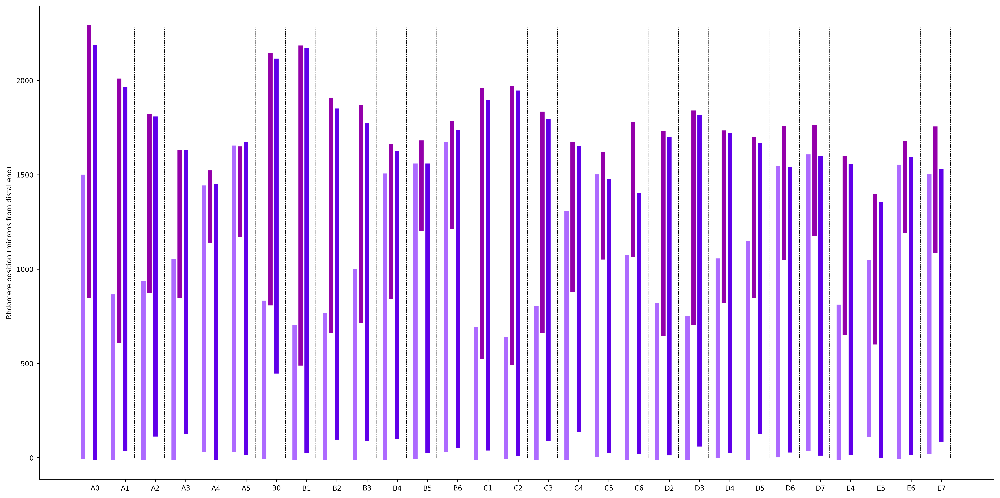

In [17]:
fig, ax = plt.subplots(figsize=[20, 10])
lvf_rows = [i for i, r in df.iterrows() if (int(r['subtype'][1]) > 6)]
lvf_df = df.loc[lvf_rows]

ylim = lvf_df['prox_z'].max()
order = {'R7': 0, 'R8': 1, 'R7p': 2}

pr_spacing = 5.0
om_spacing = 10.0
xtick_pos = []
xtick_labels = []

x = 0
i = 0

for om, rows in lvf_df.groupby('om'):
    
    for ind, r in rows.iloc[rows['subtype'].map(order)].iterrows():
        
        y1 = r['dist_z']
        y2 = r['prox_z']
        ax.plot([x, x], [y1, y2], c=cm[r['subtype']], linewidth=5.0)
        i += 1
        x += pr_spacing

        if (i % 3 == 0) and (i > 0):
            xtick_pos.append(x - pr_spacing)
            xtick_labels.append(om)
            x += om_spacing
            ax.plot([x, x], [0, ylim], c='k', linestyle='--', linewidth=0.5)
            x += om_spacing
        x += pr_spacing
        
ax.set_xticks(xtick_pos)
ax.set_xticklabels(xtick_labels)
ax.set_ylabel('Rhdomere position (microns from distal end)')


Text(0, 0.5, 'Distal position of photoreceptor rhabdomeres')

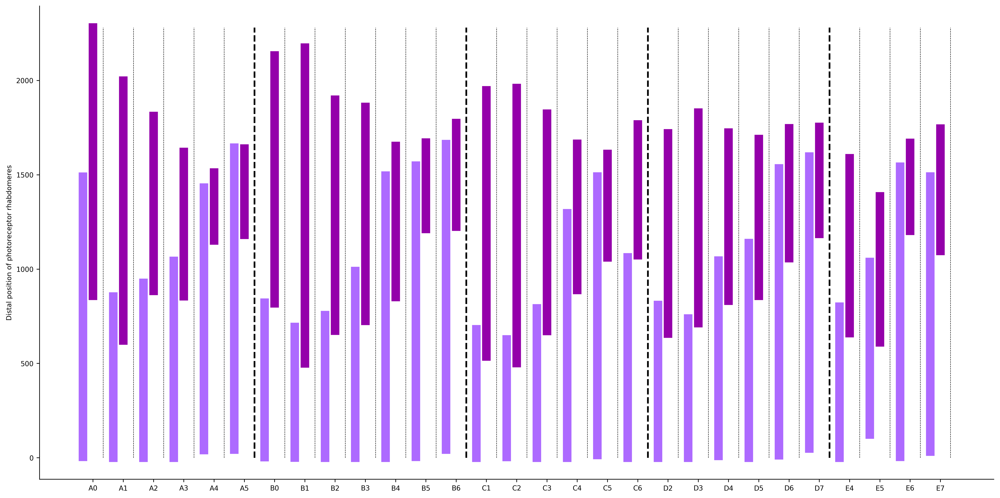

In [18]:
fig, ax = plt.subplots(figsize=[20, 10])
lvf_rows = [i for i, r in df.iterrows() if r['subtype'] in ['R7', 'R8']]
lvf_df = df.loc[lvf_rows]

ylim = lvf_df['prox_z'].max()
order = {'R7': 0, 'R8': 1}

spacing = 5.0

x = 0
i = 0
xtick_pos = []
xtick_labels = []

for om, rows in lvf_df.groupby('om'):
    
    for ind, r in rows.iloc[rows['subtype'].map(order)].iterrows():
        
        y1 = r['dist_z']
        y2 = r['prox_z']
        ax.plot([x, x], [y1, y2], c=cm[r['subtype']], linewidth=10.0)
        i += 1
        x += spacing

        if (i % 2 == 0) and (i > 0):
            xtick_pos.append(x - spacing)
            xtick_labels.append(om)
            x += spacing
            if om in ['A5', 'B6', 'C6', 'D7']:
                ax.plot([x, x], [0, ylim], c='k', linestyle='--', linewidth=2.0)
            else:
                ax.plot([x, x], [0, ylim], c='k', linestyle='--', linewidth=0.5)
            x += spacing
        x += spacing
ax.set_xticks(xtick_pos)
ax.set_xticklabels(xtick_labels)
ax.set_ylabel('Distal position of photoreceptor rhabdomeres')
